<h4>Citations </h4>

1)  https://www.astro.phys.s.chiba-u.ac.jp/cans/doc/sabun.html#lax-wendroff
2)  https://qiita.com/KQTS/items/354c85adb7d46e28e8da

<h4>Advection equation</h4>
<h4 >1. continuity equation with constant velocity(one dimension) : </h4>
<h3>$ \frac{\partial{u}}{\partial{t}}+ c\frac{\partial{u}}{\partial{x}} = 0\hspace{4mm}(1)$</h3>
<h4 >2. Analytical solutions : </h4>
<h3>$ u(x,t)=u_0(x-ct)\hspace{4mm}(2)$</h3>
<h4 >3. Applying initial conditions : </h4>
<h3>$
u(x,0)=\left\{\begin{matrix}
2&x\in[1,4]\\
1&x\in[0,1)\cup(4,10]
\end{matrix}\right.$   
</h3>


In [1]:
import tensorflow as tf
from tensorflow import keras
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.animation as animation
from IPython.display import HTML
c = 1


<h4>Simulations</h4>
<h4>1. Upwind differencing(Backward differencing) :</h4>
<h3>$ \frac{u_i^{n+1}-u_i^n}{\Delta t} +c\frac{u_i^n-u_{i-1}^n}{\Delta x} = 0
\hspace{4mm}(1)$</h3>
<h4>Substituting$ \frac{c \Delta t}{\Delta x} $for $\alpha $ yields</h4>
<h3>$ u_i^{n+1} = u_i^n -\alpha(u_i^n-u_{i-1}^n)
\hspace{4mm}(2)$</h3>
<h4> Courant condition: $\alpha = \frac{c \Delta t}{\Delta x} < 1 $</h4>
<h3>$ u_i^{n+1} = (1-\alpha)u_i^n +\alpha u_{i-1}^n
\hspace{4mm}(3)$</h3>

In [13]:
deltat = 0.02
deltax = 0.1
alpha = c*deltat/deltax
t = 4

nt = int(t/deltat)
nx = int(20/deltax)

x = np.linspace(0, 20, nx)
u = np.where((x < 1) | (x >4), 0.0, 2.0)

keep1 = [u.copy()]

for n in range(nt): 
    un = u.copy()
    keep1.append(un)
    for i in range(1, nx):
        u[i] = un[i] - alpha * (un[i] - un[i-1])

In [3]:
def update_1(num):
    
    ax.cla()

    ax.plot(x, keep1[num], label="upwind")
    ax.set_title('Fluid Flow Animation')
    ax.set_xlabel('x')
    ax.set_ylabel('u')
    ax.legend()
    ax.grid()


fig = plt.figure()
ax = fig.add_subplot()
anim = animation.FuncAnimation(fig, update_1, frames=nt, interval=10)
plt.close()
HTML(anim.to_jshtml())

<h4>2. Lax-Wendroff scheme:</h4>
<h4>1) First, perform a tayler expansion: </h4>
<h4>$u_j^{n+1}=u_j^n+\Delta t \frac{\partial u}{\partial t}+\frac{1}{2} \Delta t^2 \frac{\partial^2 u}{\partial t^2}+O\left(\Delta t^3\right) \hspace{4mm}(1)$</h4>

Notice that it is possible to perform both time and spatial derivatives on advection equation$ \frac{\partial{u}}{\partial{t}}= - c\frac{\partial{u}}{\partial{x}}$

By performing further derivatives, the following two equations can be derived:
<h4>$ \frac{\partial{^2 u}}{\partial{t^2}}= - c\frac{\partial{u}}{\partial{x} \partial{t}} \hspace{4mm}(2)$</h4>
<h4>$ \frac{\partial{u}}{\partial{t}\partial{x}}= - c\frac{\partial{^2u}}{\partial{x^2}} \hspace{4mm}(3)$</h4>
Combining equations above, the following new equation can be obtained
<h4>$ \frac{\partial{^2u}}{\partial{t^2}}= c^2\frac{\partial{^2u}}{\partial{x^2}} \hspace{4mm}(4)$</h4>
substituing $\frac{\partial u}{\partial t} = -c \frac{\partial u}{\partial x}$ and $\frac{\partial^2 u}{\partial t^2}=c^2 \frac{\partial^2 u}{\partial x^2} $into right side of equation(1) yields : 
<h4>$u_j^{n+1}=u_j^n-c\Delta t \displaystyle{{\partial u} \over {\partial
x}}+\displaystyle{1 \over 2}c^2 \Delta t^2
\displaystyle{{\partial^2 u} \over {\partial x^2}} + O(\Delta t^3) \hspace{4mm}(5)$</h4>
<h4>2) Secondly, performing central differences on spatial derivatives in equation (5) leads to the final Lax-Wendroff skeme: </h4>

$u_j^{n+1} = u_j^n - \displaystyle{1 \over 2}c\Delta t
\displaystyle{{u_{j+1}^n-u_{j-1}^n} \over {\Delta x}}
+ \displaystyle{1 \over 2}c^2 \left(\displaystyle{{\Delta t} \over
{\Delta x}} \right )^2 (u_{j+1}^n-2u_j^n+u_{j-1}^n)\hspace{4mm}(6)$

In [4]:
u = np.where((x < 1) | (x >4), 0.0, 2.0)
keep2 = [u.copy()]

for n in range(nt): 
    un = u.copy()
    keep2.append(un)
    for i in range(1, nx-1):
        u[i] = un[i] - 0.5* alpha * (un[i+1] - un[i-1]) +0.5*alpha**2*(un[i+1] - 2*un[i]+un[i-1])

In [5]:
def update_plot(num):
    
    ax.cla()
    x = np.linspace(0, 20, nx)
    p = np.where((x-deltat*num < 1) | (x-deltat*num >4), 0.0, 2.0) # analytical
    
    ax.plot(x, p, label="analytical")
    ax.plot(x, keep1[num], label="upwind")
    ax.plot(x, keep2[num], label="Lax-Wendroff")
    ax.set_title('Fluid Flow Animation')
    ax.set_xlabel('x')
    ax.set_ylabel('u')
    ax.legend()
    ax.grid()


fig = plt.figure()
ax = fig.add_subplot()
ani = animation.FuncAnimation(fig, update_plot, frames=nt, interval=10)
ani.save("trapezoid_form.gif", writer="imagemagick")
plt.close()
HTML(ani.to_jshtml())

MovieWriter imagemagick unavailable; using Pillow instead.


<h4>Details about the NN-architecture</h4>

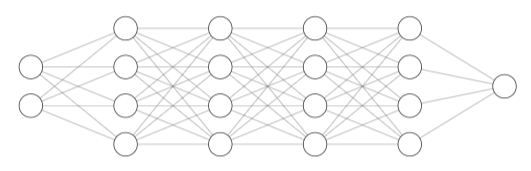

2 Inputs : t and x (concatenated after input)
4 layers with 32 neurons( neurons under 100 all worked well), sigmoid(tanh, elu also works) activation function with Xavier scheme( GlorotNormal initializer)
1 output

  Loss = ALoss1 +BLoss2
1) Loss1 contains two parts, first, MSE( u_x + c u_t ), corresponding to the internal point loss function
2) Loss2 is MSE( u(x, 0 )- u_x0), corresponding to the loss on

3) the second part of Loss1 is MSE(u(0, t) -u_t0) , this loss is somehow not needed in simulations and analytical solutions. However, with simulations we have to copy the information of boundary points to perform predictions for the next data point while we dont know if there is another wave coming. In other words, physics laws or actual conditions are not included in solving the equation with simulations, causing divergent problems and impossibility of predicting data points after long time lapse. PINNs provide us a more physical way of solving this equation, which should be considered not just a math problem. If Loss3 is not provided, PINNs try to reduce the Loss1 and Loss2 so hard that it even predicts the fluid to be a negative value.

<h4>Notice that u_t0 on the boundary could be set to 0 because that $e^-9$ is too small that even the information drop error could have a larger impact</h4>



4) A, B are hyperparameters to tackle, I noticed that functions that are more twisted prefer lower A with a lower learning rate to converge

In [6]:
def MLP(n_input1, n_input2, n_output, n_neuron, n_layer, act_fn):
    tf.random.set_seed(1234)
    input1 = keras.layers.Input(shape=(n_input1,))
    input2 = keras.layers.Input(shape=(n_input2,))

    
    merged = keras.layers.concatenate([input1, input2])
    hidden_layers=[]
    
    for _ in range(n_layer):
        hidden = keras.layers.Dense(
            units=n_neuron,
            activation=act_fn,
            kernel_initializer=tf.keras.initializers.GlorotNormal())
        hidden_layers.append(hidden)
        
    for hidden in hidden_layers:
            merged = hidden(merged)
        
    
    output = keras.layers.Dense(
            units=n_output,
            activation="elu",
            kernel_initializer=tf.keras.initializers.GlorotNormal()
            )(merged)
    
    model = tf.keras.models.Model(inputs=[input1, input2], outputs=output)    

    return model

class EarlyStopping:

    def __init__(self, patience=10, verbose=0):

        self.epoch = 0 
        self.pre_loss = float('inf') 
        self.patience = patience
        self.verbose = verbose # 早期終了メッセージの出力フラグをパラメーターで初期化

    def __call__(self, current_loss):

        if self.pre_loss < current_loss: 
            self.epoch += 1 

            if self.epoch > self.patience: 
                if self.verbose: 
                    print('early stopping')
                return True

        else: 
            self.epoch = 0 
            self.pre_loss = current_loss 

        return False


class PhysicsInformedNNs():

    def __init__(self, n_input1,n_input2, n_output, n_neuron, n_layer, epochs, act_fn='tanh'):
        self.n_input1 = n_input1
        self.n_input2 = n_input2
        self.n_output = n_output
        self.n_neuron = n_neuron
        self.n_layer = n_layer
        self.epochs = epochs
        self.act_fn = act_fn

    def build(self, optimizer, loss_fn, early_stopping):
        self._model = MLP(self.n_input1,self.n_input2, self.n_output, self.n_neuron, self.n_layer, self.act_fn)
        self._optimizer = optimizer
        self._loss_fn = loss_fn
        self._early_stopping = early_stopping
        return self

    def train_step(self, t_data1,x_data1, u_data1,t_data2,x_data2,u_data2, t_pinn,x_pinn, c,loop):
        with tf.GradientTape() as tape_total:
            tape_total.watch(self._model.trainable_variables)
            u_pred_1 = self._model([t_data1, x_data1])
            u_pred_2 = self._model([t_data2, x_data2])
            loss1_1 = self._loss_fn(u_pred_1, u_data1)
            loss1_2 = self._loss_fn(u_pred_2, u_data2)
            loss1 = loss1_1 + loss1_2
            loss1 = tf.cast(loss1, dtype=tf.float32)
            
            with tf.GradientTape() as tape1:  
                tape1.watch(t_pinn)
                u_pred_pinn = self._model([t_pinn, x_pinn])
            u_t = tape1.gradient(u_pred_pinn, t_pinn)
            
            with tf.GradientTape() as tape2:
                tape2.watch(x_pinn)      
                u_pred_pinn = self._model([t_pinn, x_pinn])
            u_x = tape2.gradient(u_pred_pinn, x_pinn)

            u_t = tf.cast(u_t, dtype=tf.float32)
            u_x = tf.cast(u_x, dtype=tf.float32)

            loss_physics = u_t + c * u_x
            loss2 = self._loss_fn(loss_physics, tf.zeros_like(loss_physics))
            loss2 = tf.cast(loss2, dtype=tf.float32)
         
            loss = loss1 + loss2 
            
        self._optimizer.minimize(loss, self._model.trainable_variables, tape=tape_total)
        self._loss_values.append(loss)
        
        if loop % 300 ==0:
            print("loss1_1: ",loss1_1.numpy(),"loss1_2:", loss1_2.numpy(),"loss2: ",loss2.numpy(),"loss: ",loss.numpy(),  "train_step:",loop)
        if loop % 500 == 0:
            u_pred_test = self._model([t_data1, x_data1])
            plt.plot(x_data1, u_pred_test, label="loop{}".format(loop))
            plt.legend()
            plt.grid()
            plt.show()
        return self

    def train(self, t_data1, x_data1,u_data1,t_data2,x_data2,u_data2, t_pinn,x_pinn, c):
        self._loss_values = []
        self.loop = 0
        for i in range(self.epochs):
            self.loop += 1
            self.train_step(t_data1, x_data1,u_data1,t_data2,x_data2,u_data2, t_pinn,x_pinn, c, self.loop)
            if self._early_stopping(self._loss_values[-1]):
                break

In [18]:
# boundary condition
t= 4
points = 200
x_pinn = np.array([np.linspace(0,20, points)]*points)
x_pinn = tf.reshape(x_pinn,[-1,1])

t_pinn = tf.linspace(0,t, points)
t_pinn = tf.reshape(t_pinn, [-1,1])
t_pinn = tf.tile(t_pinn, [1, points])
t_pinn = tf.reshape(t_pinn, [-1,1])
t_input = tf.linspace(0,t, nt)

x_boundary_points = [i for i in range(nx)]
t_boundary_points = [0]
u_boundary_points = [i for i in range(nx)]


x_data1 = tf.gather(x, x_boundary_points )
u = tf.where(((x_data1 <1 ) | ( x_data1 >4)), 0.0, 2.0)
x_data1 = tf.reshape(x_data1,[-1,1])
t_data1 = tf.zeros_like(x_data1)
u_data1 = tf.gather(u, u_boundary_points)
# u_data1 = tf.reshape(u_data1 , [-1,1])

t_starting_points = [i for i in range(nt)]

t_data2 = tf.gather(t_input, t_starting_points)
x_data21= tf.zeros_like(t_data2)
x_data21 = tf.cast(x_data21, dtype=tf.float32) 
x_data22 = tf.fill(nt, 20.0)
x_data22 = tf.cast(x_data21, dtype=tf.float32) 
t_data2 = tf.concat([t_data2, t_data2], axis=0)
t_data2 = tf.reshape(t_data2, [-1,1])

x_data2 = tf.concat([x_data21, x_data22], axis=0)
x_data2 = tf.reshape(x_data2, [-1,1])
u_data2= tf.zeros_like(x_data2)
u_data2= tf.reshape(u_data2, [-1,1])

loss1_1:  0.073153295 loss1_2: 0.00018482543 loss2:  0.0034120113 loss:  0.07675013 train_step: 300


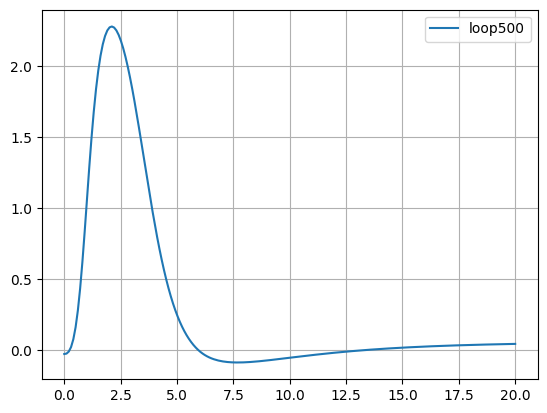

loss1_1:  0.050078023 loss1_2: 3.9119823e-05 loss2:  0.0010734736 loss:  0.051190615 train_step: 600
loss1_1:  0.025608052 loss1_2: 2.681461e-06 loss2:  0.00083744153 loss:  0.026448175 train_step: 900


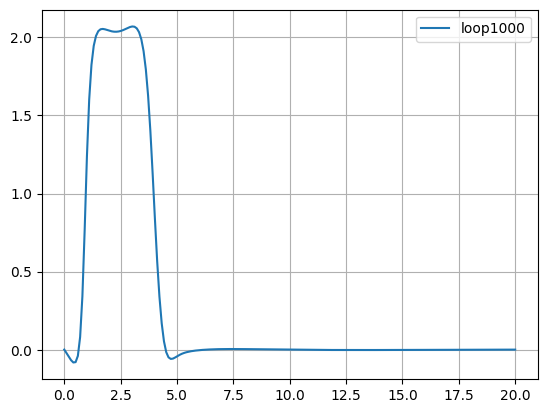

loss1_1:  0.014200347 loss1_2: 4.2581446e-06 loss2:  0.0005551629 loss:  0.014759768 train_step: 1200
loss1_1:  0.009626525 loss1_2: 6.239525e-06 loss2:  0.00038804533 loss:  0.010020811 train_step: 1500


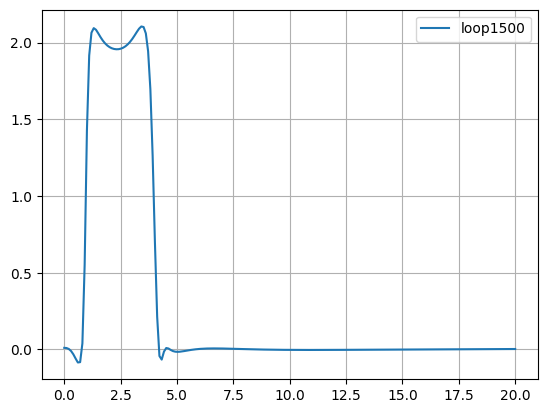

loss1_1:  0.0066259974 loss1_2: 4.6416812e-06 loss2:  0.00030301965 loss:  0.006933659 train_step: 1800


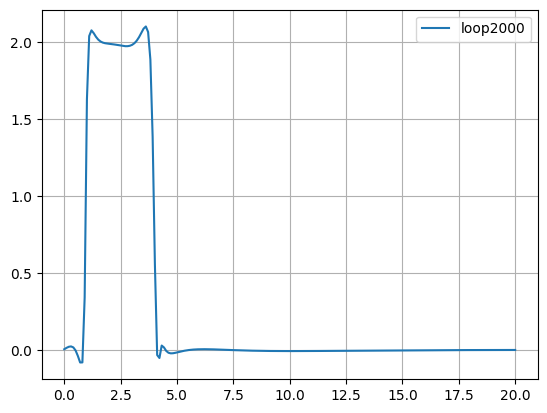

loss1_1:  0.0044829478 loss1_2: 2.5160168e-06 loss2:  0.00023234921 loss:  0.004717813 train_step: 2100
loss1_1:  0.0029609574 loss1_2: 8.352197e-06 loss2:  0.00017608392 loss:  0.0031453934 train_step: 2400


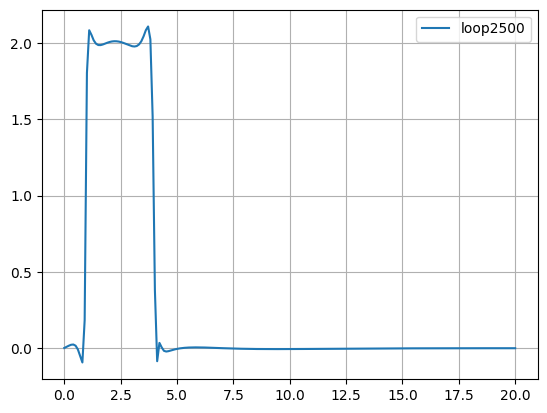

loss1_1:  0.0018049591 loss1_2: 6.849704e-07 loss2:  0.00013837764 loss:  0.0019440218 train_step: 2700
loss1_1:  0.0010191142 loss1_2: 3.8840543e-07 loss2:  0.000110136556 loss:  0.0011296391 train_step: 3000


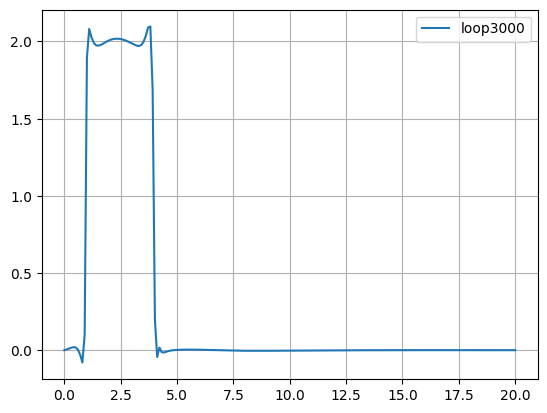

loss1_1:  0.0005728128 loss1_2: 9.755848e-06 loss2:  8.882223e-05 loss:  0.00067139085 train_step: 3300


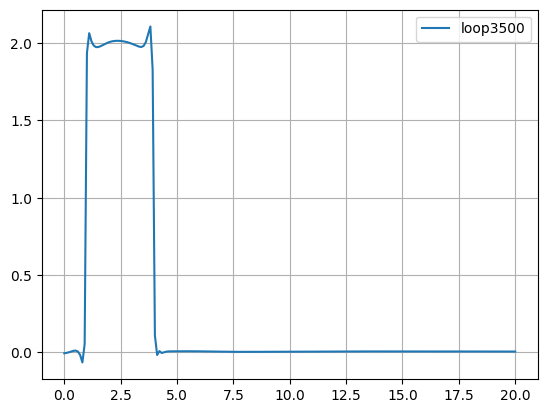

loss1_1:  0.00032241986 loss1_2: 4.98281e-07 loss2:  7.3263705e-05 loss:  0.00039618186 train_step: 3600
loss1_1:  0.00019251737 loss1_2: 6.4471146e-07 loss2:  6.1194536e-05 loss:  0.00025435662 train_step: 3900


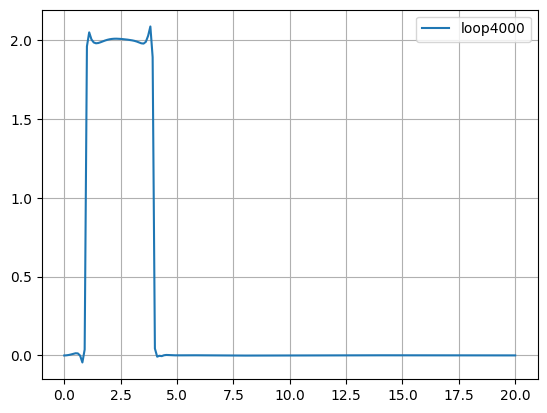

loss1_1:  0.000120053104 loss1_2: 4.895583e-07 loss2:  5.1477527e-05 loss:  0.00017202018 train_step: 4200
loss1_1:  7.816626e-05 loss1_2: 7.4109846e-07 loss2:  4.3702046e-05 loss:  0.0001226094 train_step: 4500


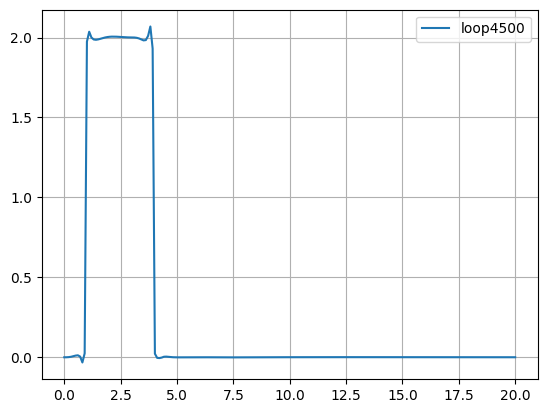

loss1_1:  5.2779535e-05 loss1_2: 4.830735e-07 loss2:  3.7535603e-05 loss:  9.079821e-05 train_step: 4800


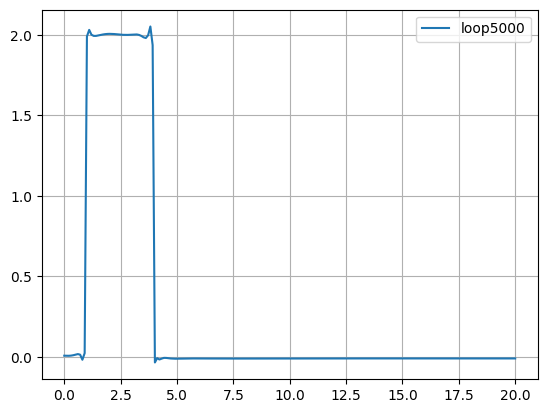

loss1_1:  7.365157e-05 loss1_2: 2.5872792e-05 loss2:  3.2837077e-05 loss:  0.00013236144 train_step: 5100
loss1_1:  2.7258822e-05 loss1_2: 2.7882908e-07 loss2:  2.848165e-05 loss:  5.60193e-05 train_step: 5400


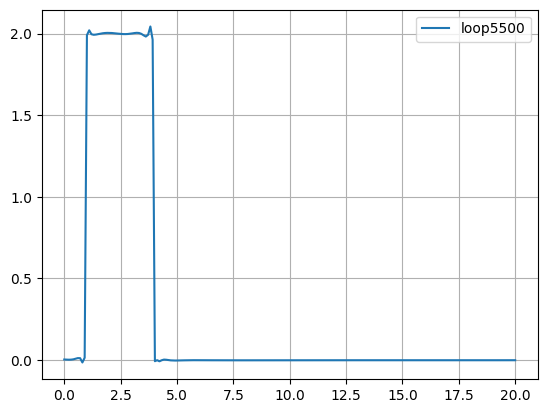

loss1_1:  4.0164214e-05 loss1_2: 1.3365867e-05 loss2:  2.5128811e-05 loss:  7.865889e-05 train_step: 5700
loss1_1:  1.695107e-05 loss1_2: 3.1101783e-07 loss2:  2.1911457e-05 loss:  3.9173545e-05 train_step: 6000


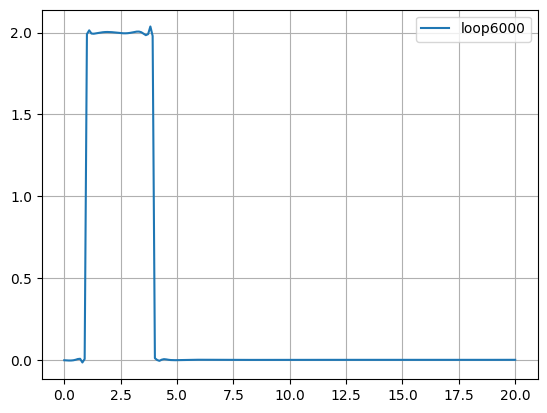

loss1_1:  3.300302e-05 loss1_2: 1.2365973e-05 loss2:  1.9234312e-05 loss:  6.460331e-05 train_step: 6300


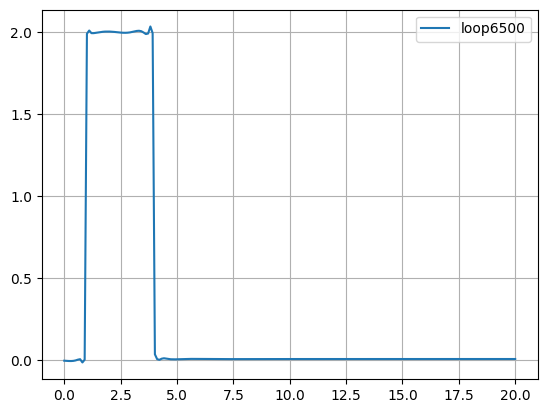

loss1_1:  1.6739732e-05 loss1_2: 2.9890432e-06 loss2:  1.64071e-05 loss:  3.6135876e-05 train_step: 6600
loss1_1:  3.0050194e-05 loss1_2: 1.26580635e-05 loss2:  1.4006001e-05 loss:  5.6714256e-05 train_step: 6900


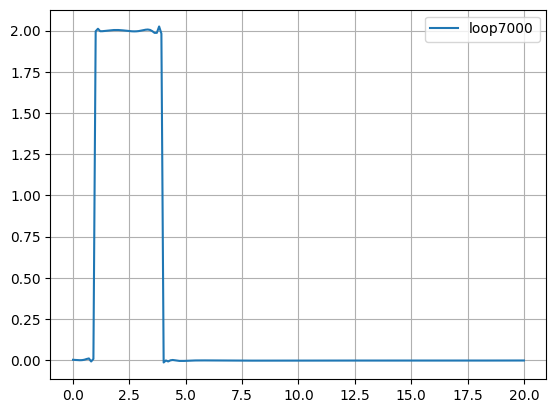

loss1_1:  9.182598e-06 loss1_2: 2.9922313e-07 loss2:  1.1523167e-05 loss:  2.1004988e-05 train_step: 7200
loss1_1:  8.011508e-06 loss1_2: 1.7477694e-07 loss2:  9.5603955e-06 loss:  1.7746679e-05 train_step: 7500


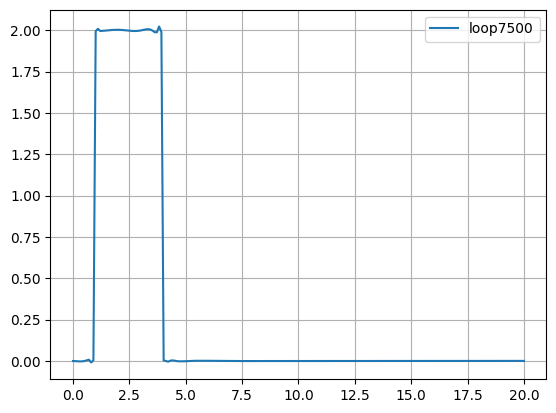

loss1_1:  1.1330259e-05 loss1_2: 2.6250625e-06 loss2:  7.974872e-06 loss:  2.1930195e-05 train_step: 7800


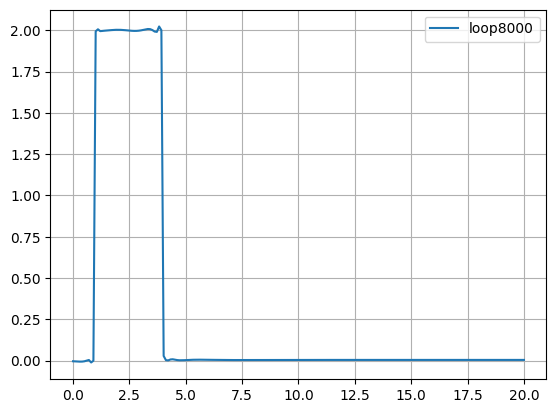

loss1_1:  8.022989e-05 loss1_2: 4.927209e-05 loss2:  7.361847e-06 loss:  0.00013686382 train_step: 8100
loss1_1:  8.715325e-06 loss1_2: 1.9200077e-06 loss2:  5.5540963e-06 loss:  1.618943e-05 train_step: 8400


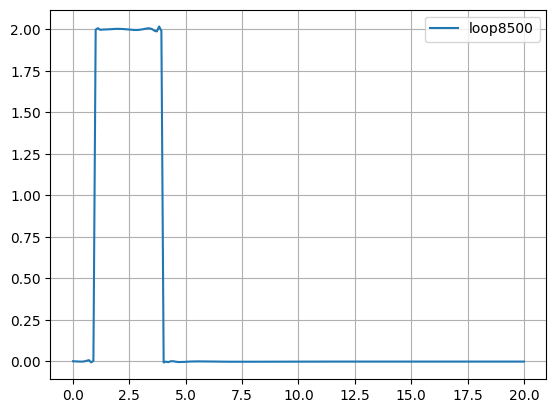

loss1_1:  2.240551e-05 loss1_2: 1.14529485e-05 loss2:  4.8244024e-06 loss:  3.868286e-05 train_step: 8700
loss1_1:  9.950931e-06 loss1_2: 3.910247e-06 loss2:  3.9652587e-06 loss:  1.7826436e-05 train_step: 9000


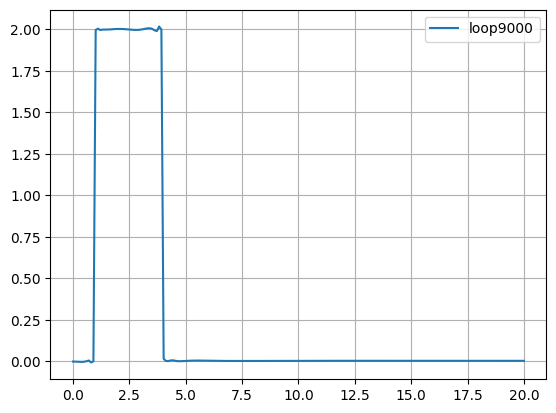

loss1_1:  3.1564938e-05 loss1_2: 1.8618193e-05 loss2:  3.650136e-06 loss:  5.3833268e-05 train_step: 9300


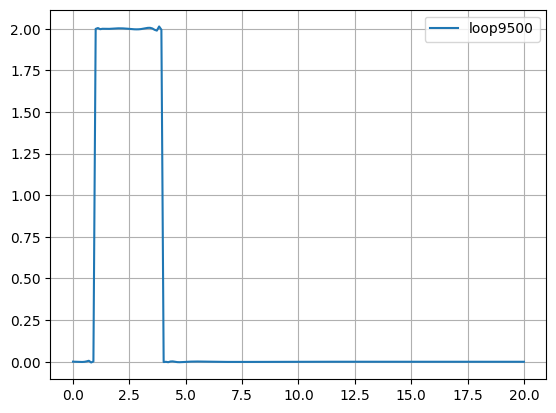

loss1_1:  4.5094093e-06 loss1_2: 5.5054767e-07 loss2:  2.8792595e-06 loss:  7.939217e-06 train_step: 9600
loss1_1:  1.1364559e-05 loss1_2: 5.3443587e-06 loss2:  2.5946986e-06 loss:  1.9303618e-05 train_step: 9900


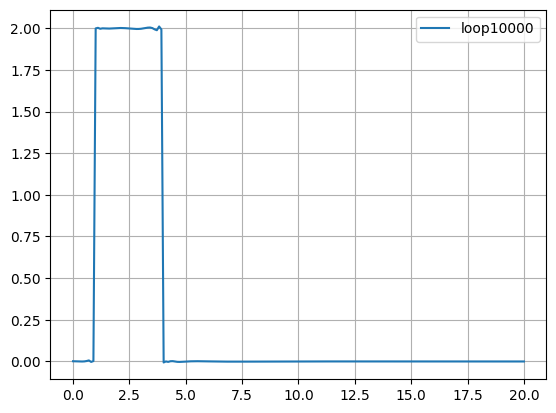

loss1_1:  1.5914604e-05 loss1_2: 5.749792e-06 loss2:  2.553923e-06 loss:  2.421832e-05 train_step: 10200
loss1_1:  2.0179787e-05 loss1_2: 1.27703815e-05 loss2:  2.1152466e-06 loss:  3.5065415e-05 train_step: 10500


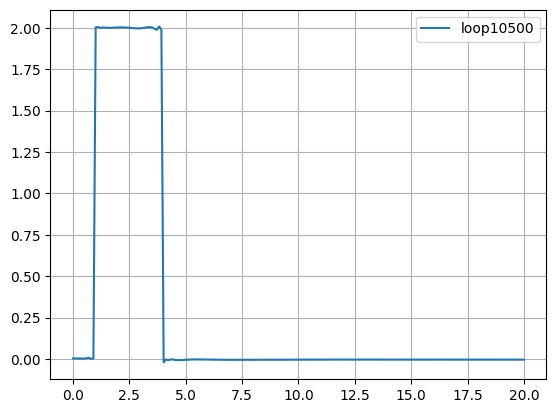

loss1_1:  2.8985849e-06 loss1_2: 1.364333e-06 loss2:  1.7278096e-06 loss:  5.990728e-06 train_step: 10800


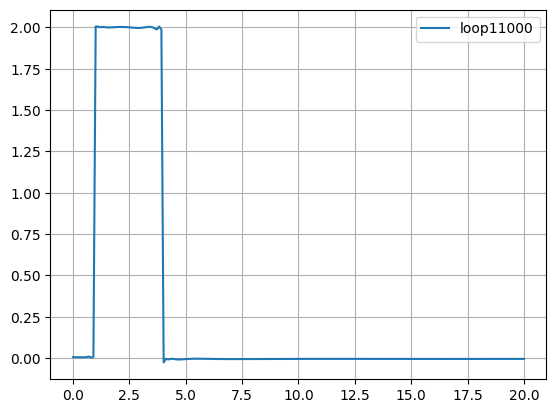

loss1_1:  8.2188135e-06 loss1_2: 3.827193e-06 loss2:  1.6407433e-06 loss:  1.3686749e-05 train_step: 11100
early stopping


In [19]:
c = 1
PINNs = PhysicsInformedNNs(1,1,1,32,3,35000)
optimizer = tf.keras.optimizers.Adam(learning_rate = 1e-3)
loss_fn = tf.keras.losses.MeanSquaredError()
early_stopping = EarlyStopping(patience=150,verbose=1)
PINNs.build(optimizer, loss_fn, early_stopping)
PINNs.train( t_data1,x_data1, u_data1,t_data2,x_data2,u_data2, t_pinn,x_pinn, c)

Discoverys:

1) PINNs does not work well when the right boundary is too close to the wave, at first I trained the model with x between 0 and 10 but PINNs seem to give a diverging plot as the wave approach the right region. The reason seems is when the wave approach the right boundary, PINNs are unable to calculate Loss2 in the vicinity of or beyond the wall. Consequently, they update weights based only on the limited information available, leading to predictions resembling the left half of an exponential function. From this perspective, PINNs are well-suited for making predictions over relatively large spatial and temporal scales. This is considered optimal for resolving accumulated errors over time through simulation methods.

In [20]:
x_test = tf.linspace(0, 20, nx)
x_test = tf.reshape(x_test,[-1,1])
t_p= np.linspace(0, 4 , nt)
u_pred=[]
for i in range(nx):
    tu = tf.fill(nx, t_p[i])
    tu = tf.reshape(tu, [-1,1])
    u_pred.append(np.reshape(PINNs._model([tu,x_test]), (-1)))
    

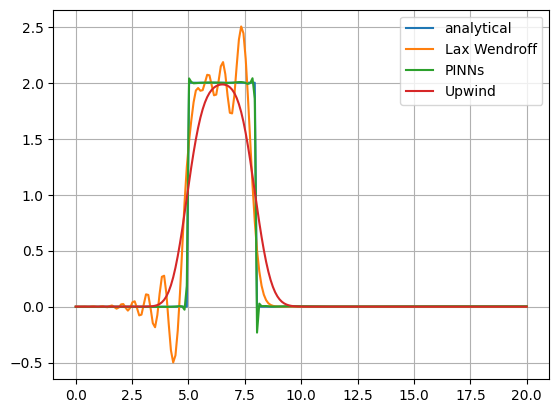

In [21]:
t_test = np.array([t] * nx)
t_test = tf.reshape(t_test, [-1,1])
u_4sec = PINNs._model([t_test, x_test], (-1))
u_4sec_true =  tf.where(((x_data1-4 <1.0 ) | ( x_data1-4 >4.0)), 0.0, 2.0)
plt.plot(x_test, u_4sec_true, label="analytical")
plt.plot(x, keep2[200], label="Lax Wendroff")
plt.plot(x_test, u_4sec, label="PINNs")
plt.plot(x, keep1[200], label="Upwind")
plt.grid(True)
plt.legend()
plt.show()

In [22]:
# Calculate and compare the loss
import pandas as pd
def calculate_mse(array1, array2):
    if len(array1) != len(array2):
        raise ValueError("Input arrays must have the same length.")
    
    squared_errors = (array1 - array2) ** 2
    mse = np.mean(squared_errors)
    return mse

mse_PINNs = calculate_mse(u_4sec, u_4sec_true)
mse_Lax=calculate_mse(keep2[200], u_4sec_true)
mse_Upwind=calculate_mse(keep1[200], u_4sec_true)

data = {
    'Method': ['PINNs', 'Lax', 'Upwind'],
    'MSE': [mse_PINNs, mse_Lax, mse_Upwind]
}

df = pd.DataFrame(data)

# 表を出力
print(df)

   Method       MSE
0   PINNs  0.000572
1     Lax  1.003001
2  Upwind  0.892835


In [24]:
def update_plot(num):
    
    ax.cla()
    x = np.linspace(0, 20, int(20 / deltax))
    p = np.where((x-deltat*num < 1) | (x-deltat*num >4), 0, 2) # analytical
    
    ax.plot(x, p, label="analytical")
    ax.plot(x_test, u_pred[num], label="PINNs")
    ax.plot(x, keep1[num], label="upwind")
    ax.plot(x, keep2[num], label="Lax-Wendroff")
    ax.set_title('Fluid Flow Animation')
    ax.set_xlabel('x')
    ax.set_ylabel('u')
    ax.legend()
    ax.grid()


fig = plt.figure()
ax = fig.add_subplot()
ani = animation.FuncAnimation(fig, update_plot, frames=nt, interval=10)
ani.save("trapezoid_form.gif", writer="imagemagick")
plt.close()
# HTML(ani.to_jshtml())

MovieWriter imagemagick unavailable; using Pillow instead.
